In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import textwrap

import duckdb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import polars as pl
import textwrap
import re
import matplotlib.gridspec as gridspec
import altair as alt

In [3]:
from rcssim import rcs_sim as rcs

# This notebook is to verify there are not non-linearities with on-board calculated delta, particularly at high values

In [4]:
con = duckdb.connect(database='/media/shortterm_ssd/Clay/databases/duckdb/rcs-db.duckdb', read_only=True)

In [5]:
def drop_unwanted_sessions_by_count(df: pl.DataFrame, column: str, count_cutoff: int, identity_col: str) -> (pl.DataFrame, list):
    """
    Drops columns which have a not null count below count_cutoff threshold. Used for removing sessions that have only a few power_band outputs.
    Also returns list of 'Session#'s which were dropped.
    :param df:
    :param column:
    :param count_cutoff:
    :return:
    """
    bad_sessions = df.groupby(identity_col).agg([
        pl.col(column).is_not_null().sum().alias('col Not Null')
    ]).filter(
        pl.col('col Not Null') < count_cutoff
    ).select(identity_col).to_dict(as_series=False)[identity_col]

    return df.filter(pl.col(identity_col).is_in(bad_sessions).is_not()), bad_sessions


In [6]:
def drop_unwanted_sessions_by_NaN_percent(df: pl.DataFrame, column: str, perc_cutoff: int, identity_col: str) -> (pl.DataFrame, list):
    bad_sessions = df.groupby(identity_col).agg([
        (pl.col(column).is_not_null().sum() / pl.col(column).count()).alias('col Not Null')
    ]).filter(
            pl.col('col Not Null') < perc_cutoff
        ).select(identity_col).to_dict(as_series=False)[identity_col]
    
    return df.filter(pl.col(identity_col).is_in(bad_sessions).is_not()), bad_sessions

In [7]:
def get_first_two_not_null_PB_inds(df: pl.DataFrame, pb_column: str, sessionNum: str, identity_col) -> np.ndarray:
    """
    Returns indices of first 2 not-null power_band values. Index 0 is the start of Time Series of sessionNum.
    :param df:
    :param column:
    :param sessionNum:
    :return:
    """
    inds = np.argwhere(~np.isnan(
        df.filter((pl.col(identity_col) == sessionNum)).select(pb_column).to_numpy().squeeze()
    )).squeeze()
    return inds[:2]


In [8]:
def get_settings_for_pb_calcs(device, db_con, session_nums, identity_col):
    """
    Get the relevant settings to run rcs_sim package functions:
        rcs.create_hann_window
        rcs.transform_mv_to_rcs
        rcs.td_to_fft
        rcs.fft_to_pb

    :param device:
    :param db_con:
    :param session_nums:
    :return:
    """
    # TODO: FIX THIS FUNCTION TO ALLOW FOR identity_col = 'Session#'

    td_settings = db_con.execute(f"Select {identity_col}, samplingRate, columns('^gain') from r{device}.TDSettings where {identity_col} in {*session_nums,}").df()
    fft_settings = db_con.execute(f"Select {identity_col}, fft_bandFormationConfig, fft_interval, fft_size, fft_windowLoad, columns('^Power_Band') from r{device}.FftAndPowerSettings where SessionIdentity in {*session_nums,}").df()
    settings_df = pd.concat([td_settings, fft_settings], axis=1, join='inner')
    settings_df['fft_bandFormationConfig'] = settings_df['fft_bandFormationConfig'].str.extract('(\d+)').astype(int)
    if not (np.sum(np.unique(settings_df.loc[:, settings_df.columns!=identity_col].nunique().values)) == 1):
        print("WARNING: Session numbers provided have different settings.")
        print('Settings dataframe:')
        print(settings_df)

    return settings_df.loc[:, settings_df.columns!=identity_col].drop_duplicates().to_dict('list')

In [9]:
sessions = con.execute("Select distinct SessionIdentity from overnight.r02L").fetchall()

In [10]:
sessions = [x[0] for x in sessions]
sessions

['02L_04-26-22',
 '02L_05-03-22',
 '02L_05-05-22',
 '02L_04-22-22',
 '02L_04-30-22',
 '02L_04-21-22',
 '02L_04-29-22',
 '02L_04-28-22',
 '02L_04-27-22',
 '02L_05-04-22',
 '02L_05-06-22']

In [11]:
settings = get_settings_for_pb_calcs('02L', con, sessions, 'SessionIdentity')
print(settings)

{'samplingRate': [500], 'gain_1': [232], 'gain_2': [231], 'gain_3': [233], 'gain_4': [231], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-29.79'], 'Power_

In [12]:
# TODO: Need to pull out correct TD sections from data_td (starting from output of function above). Align with DerivedTime and SleepStage.
# TODO cont: Call td_to_fft --> save output (with DerivedTime and SleepStage) for feature selection
# TODO cont: Call fft_to_pb and align with df to compare Power_Bands with estimated pbs
# Run for each session
# Run for each device
# Save outputs as parquets?

In [13]:
def get_TD_data(df, sessionNum, identity_col, pb_ind, fft_size_non_zero):
    df_tmp = df.filter(pl.col(identity_col) == sessionNum).select(['DerivedTime', pl.col("^TD.*$")])
    if pb_ind[0] > fft_size_non_zero:
        return df_tmp[pb_ind[0]-fft_size_non_zero:,:]
    else:
        return df_tmp[pb_ind[1]-fft_size_non_zero:,:]

In [14]:
def get_gains_from_settings_dict(settings, sessions, identity_col, device, db_con) -> np.ndarray:
    """

    :param settings:
    :param sessions:
    :param identity_col:
    :param device:
    :param db_con:
    :return:
    """
    td_settings = db_con.execute(f"Select columns('^chan'), columns('^gain') from r{device}.TDSettings where {identity_col} in {*sessions,}").df().drop_duplicates()
    if len(td_settings) > 1:
        print(f"WARNING: MULTIPLE TIME DOMAIN SETTINGS FOUND for {device} sessions {sessions}. Using the first unique values.")
    gains = []
    for i in range(1,len(td_settings.columns)+1):
        if (f"chan{i}" in td_settings.columns) and not ('Disabled' in td_settings[f"chan{i}"][0]):
            gains.append(td_settings[f"gain_{i}"][0])
    return np.array(gains)

In [593]:
def estimate_powerbands(df, identity_col, device, db_con) -> pl.DataFrame:
    # This is bad programming. Allow sessions to be determined from Session#

    # Get relevant settings for Device
    sessions = df.select('SessionIdentity').unique().to_dict(as_series=False)['SessionIdentity']
    settings = get_settings_for_pb_calcs(device, db_con, sessions, 'SessionIdentity')
    print(f'ON DEVICE: {device}')
    print(settings)
    fft_size_non_zero = (settings['fft_size'][0] - settings['fft_size'][0]%250)
    gain = np.unique([settings['gain_1'][0], settings['gain_2'][0], settings['gain_3'][0], settings['gain_4'][0]])
    if np.size(gain) > 1:
        print(f"WARNING: MORE THAN 1 UNIQUE GAIN VALUE ACROSS CHANNELS for {device}: {gain}")
    else:
        gain = gain[0]

    power_bands = [x for x in df.columns if re.search('Power_Band',x)]
    print(power_bands)
    # Ensure power bands are in order, as this is assumed for the mapping of Time Domain channels to Power Band Bins
    assert(len(power_bands) == 6)
    assert(
        all(int(power_bands[i][-1]) <= int(power_bands[i+1][-1]) for i in range(len(power_bands) -1))
    )
    power_band_nums = [int(power_band[-1]) for power_band in power_bands]
    # Get PowerBand ranges
    band_edges = [[float(edge) for edge in settings[power_band][0].split("-")] for power_band in power_bands]
    print(f"band edges: {band_edges}")

    # Add dummy columns to df...

    sessionNums = df.select(identity_col).unique().to_dict(as_series=False)[identity_col]
    for i, session in enumerate(sessionNums):
        sesh_inds = get_first_two_not_null_PB_inds(df, 'Power_Band8', session, identity_col)
        streams = get_TD_data(df, session, identity_col, sesh_inds, fft_size_non_zero)
        hann_win = rcs.create_hann_window(settings['fft_size'][0], percent=100)
        # Compute power band for the first time-domain channel
        streams_np = streams.to_numpy()
        data_td = rcs.transform_mv_to_rcs(streams_np[:,1:], gain)

        data_fft_keyBG, t_pb = rcs.td_to_fft(data_td[:,0],
                                            streams_np[:,0], settings['samplingRate'][0],
                                            settings['fft_size'][0], settings['fft_interval'][0],
                                            hann_win, output_in_mv=False)
        data_pb_BG_est = rcs.fft_to_pb(data_fft_keyBG, settings['samplingRate'][0], settings['fft_size'][0],
                                     settings['fft_bandFormationConfig'][0],
                                     band_edges_hz=band_edges[:2],
                                     input_is_mv=False)

        data_fft_key2, t_pb2 = rcs.td_to_fft(data_td[:,1],
                                            streams_np[:,0], settings['samplingRate'][0],
                                            settings['fft_size'][0], settings['fft_interval'][0],
                                            hann_win, output_in_mv=False)
        data_pb_key2_est = rcs.fft_to_pb(data_fft_key2, settings['samplingRate'][0], settings['fft_size'][0],
                                       settings['fft_bandFormationConfig'][0],
                                       band_edges_hz=band_edges[2:4],
                                       input_is_mv=False)

        data_fft_key3, t_pb3 = rcs.td_to_fft(data_td[:,2],
                                            streams_np[:,0], settings['samplingRate'][0],
                                            settings['fft_size'][0], settings['fft_interval'][0],
                                            hann_win, output_in_mv=False)
        data_pb_key3_est = rcs.fft_to_pb(data_fft_key3, settings['samplingRate'][0], settings['fft_size'][0],
                                         settings['fft_bandFormationConfig'][0],
                                         band_edges_hz=band_edges[4:],
                                         input_is_mv=False)

        np.testing.assert_array_equal(t_pb, t_pb2)
        np.testing.assert_array_equal(t_pb, t_pb3)
        data_pb_ests = np.concatenate([data_pb_BG_est, data_pb_key2_est, data_pb_key3_est], axis=1)
        data_pb_dict = {'DerivedTime': t_pb} | {f'PB{power_band_nums[i]}_estimate': data_pb_ests[:,i] for i in range(np.shape(data_pb_ests)[1])}
        if i == 0:
            df_pb_est = pl.DataFrame(data_pb_dict)
        else:
            df_pb_est = pl.concat([df_pb_est, pl.DataFrame(data_pb_dict)], how='vertical')


    return df.join(df_pb_est, on='DerivedTime', how='left')




In [79]:
def estimate_powerbands_remove_nans(df, identity_col, device, db_con) -> pl.DataFrame:
    # This is bad programming. Allow sessions to be determined from Session#

    # Get relevant settings for Device
    sessions = df.select('SessionIdentity').unique().to_dict(as_series=False)['SessionIdentity']
    settings = get_settings_for_pb_calcs(device, db_con, sessions, 'SessionIdentity')
    print(f'ON DEVICE: {device}')
    print(settings)
    fft_size_non_zero = (settings['fft_size'][0] - settings['fft_size'][0]%250)

    gains = get_gains_from_settings_dict(settings, sessions, 'SessionIdentity', device, db_con)

    power_bands = [x for x in df.columns if re.search('Power_Band',x)]
    print(power_bands)
    # Ensure power bands are in order, as this is assumed for the mapping of Time Domain channels to Power Band Bins
    assert(len(power_bands) == 6)
    assert(
        all(int(power_bands[i][-1]) <= int(power_bands[i+1][-1]) for i in range(len(power_bands) -1))
    )
    power_band_nums = [int(power_band[-1]) for power_band in power_bands]
    # Get PowerBand ranges
    band_edges = [[float(edge) for edge in settings[power_band][0].split("-")] for power_band in power_bands]
    print(f"band edges: {band_edges}")


    sessionNums = df.select(identity_col).unique().to_dict(as_series=False)[identity_col]
    for j, session in enumerate(sessionNums):
        sesh_inds = get_first_two_not_null_PB_inds(df, 'Power_Band8', session, identity_col)
        streams = get_TD_data(df, session, identity_col, sesh_inds, fft_size_non_zero).to_numpy()

        MILLISECONDS_PER_SECOND = 1000
        steps_per_interval = settings['fft_interval'][0]/MILLISECONDS_PER_SECOND * settings['samplingRate'][0]


        hann_win = rcs.create_hann_window(settings['fft_size'][0], percent=100)
        # Compute power band for the first time-domain channel
        data_td = rcs.transform_mv_to_rcs(streams[:,1:], gains)

        # Iterate through each window, and calculate PB estimates
        window_starts = np.arange(0,streams.shape[0],steps_per_interval, dtype=np.int32)[:-2]
        sesh_pb_ests = np.zeros((np.size(window_starts), len(power_band_nums)))
        sesh_times = np.zeros(np.size(window_starts))

        for ind, i in enumerate(window_starts):
            curr_window=np.s_[i:i+fft_size_non_zero+1]
            if np.sum(np.isnan(data_td[curr_window,:])) == 0:
                data_fft_keyBG, t_pb = rcs.td_to_fft(data_td[curr_window,0],
                                                     streams[curr_window,0], settings['samplingRate'][0],
                                                     settings['fft_size'][0], settings['fft_interval'][0],
                                                     hann_win, output_in_mv=False)
                data_pb_BG_est = rcs.fft_to_pb(data_fft_keyBG, settings['samplingRate'][0], settings['fft_size'][0],
                                               settings['fft_bandFormationConfig'][0],
                                               band_edges_hz=band_edges[:2],
                                               input_is_mv=False)

                data_fft_key2, t_pb2 = rcs.td_to_fft(data_td[curr_window,1],
                                                     streams[curr_window,0], settings['samplingRate'][0],
                                                     settings['fft_size'][0], settings['fft_interval'][0],
                                                     hann_win, output_in_mv=False)
                data_pb_key2_est = rcs.fft_to_pb(data_fft_key2, settings['samplingRate'][0], settings['fft_size'][0],
                                                 settings['fft_bandFormationConfig'][0],
                                                 band_edges_hz=band_edges[2:4],
                                                 input_is_mv=False)

                data_fft_key3, t_pb3 = rcs.td_to_fft(data_td[curr_window,2],
                                                     streams[curr_window,0], settings['samplingRate'][0],
                                                     settings['fft_size'][0], settings['fft_interval'][0],
                                                     hann_win, output_in_mv=False)
                data_pb_key3_est = rcs.fft_to_pb(data_fft_key3, settings['samplingRate'][0], settings['fft_size'][0],
                                                 settings['fft_bandFormationConfig'][0],
                                                 band_edges_hz=band_edges[4:],
                                                 input_is_mv=False)

                np.testing.assert_array_equal(t_pb, t_pb2)
                np.testing.assert_array_equal(t_pb, t_pb3)
                sesh_times[ind] = t_pb
                sesh_pb_ests[ind,:] = np.concatenate([data_pb_BG_est, data_pb_key2_est, data_pb_key3_est], axis=1)

        data_pb_dict = {'DerivedTime': sesh_times} | {f'PB{power_band_nums[k]}_estimate': sesh_pb_ests[:,k] for k in range(np.shape(sesh_pb_ests)[1])}
        session_df = pl.DataFrame(data_pb_dict)
        session_df = session_df.filter((
            pl.col('^PB.*_estimate$').is_not_null()
        ))
        if j == 0:
            df_pb_est = session_df
        else:
            df_pb_est = pl.concat([df_pb_est, session_df], how='vertical')


    return df.join(df_pb_est, on='DerivedTime', how='left')

In [15]:
def estimate_powerbands_by_PB_inds_remove_nans(df, identity_col, device, db_con, roll_TD=False) -> pl.DataFrame:
    # This is bad programming. Allow sessions to be determined from Session#

    # Get relevant settings for Device
    sessions = df.select('SessionIdentity').unique().to_dict(as_series=False)['SessionIdentity']
    settings = get_settings_for_pb_calcs(device, db_con, sessions, 'SessionIdentity')
    print(f'ON DEVICE: {device}')
    print(settings)
    fft_size_non_zero = (settings['fft_size'][0] - settings['fft_size'][0]%250)

    gains = get_gains_from_settings_dict(settings, sessions, 'SessionIdentity', device, db_con)

    power_bands = [x for x in df.columns if re.search('Power_Band',x)]
    print(power_bands)
    # Ensure power bands are in order, as this is assumed for the mapping of Time Domain channels to Power Band Bins
    assert(len(power_bands) == 6)
    assert(
        all(int(power_bands[i][-1]) <= int(power_bands[i+1][-1]) for i in range(len(power_bands) -1))
    )
    power_band_nums = [int(power_band[-1]) for power_band in power_bands]
    # Get PowerBand ranges
    # band_edges = [[float(edge) for edge in settings[power_band][0].split("-")] for power_band in power_bands]
    # print(f"band edges: {band_edges}")

    band_edges = [[int(edge) for edge in settings[power_band+'_indices'][0].split()] for power_band in power_bands]
    # band_edges are indexed by 1. Adjust to index by 0
    band_edges = [[x[0] - 1, x[1]] for x in band_edges]
    print(f"band edges: {band_edges}")


    sessionNums = df.select(identity_col).unique().to_dict(as_series=False)[identity_col]
    for j, session in enumerate(sessionNums):
        #sesh_inds = get_first_two_not_null_PB_inds(df, 'Power_Band8', session, identity_col)
        #streams = get_TD_data(df, session, identity_col, sesh_inds, fft_size_non_zero).to_numpy()

        #MILLISECONDS_PER_SECOND = 1000
        #steps_per_interval = settings['fft_interval'][0]/MILLISECONDS_PER_SECOND * settings['samplingRate'][0]


        hann_win = rcs.create_hann_window(settings['fft_size'][0], percent=100)
        # Compute power band for the first time-domain channel
        streams = (df.filter(
                        pl.col(identity_col) == session
                    )
                    .select(['DerivedTime', pl.col('^TD_.*$')]).to_numpy()
                   )
        data_td = rcs.transform_mv_to_rcs(streams[:,1:], gains)

        if roll_TD:
            data_td = np.roll(data_td, -1, axis=0)

        # Iterate through each window, and calculate PB estimates
        window_ends = np.where(
            ~np.isnan(df.filter(
                            pl.col(identity_col) == session
                        )
                        .select(f'Power_Band{power_band_nums[-1]}').to_numpy().squeeze()
        )
        )[0]

        # Take first PB index which has a complete TD window in this session
        window_ends = window_ends[np.argmax(window_ends > fft_size_non_zero):]


        sesh_pb_ests = np.zeros((np.size(window_ends), len(power_band_nums)))
        sesh_times = np.zeros(np.size(window_ends))

        for ind, i in enumerate(window_ends):
            curr_window=np.s_[i-fft_size_non_zero:i+1]
            if ~np.isnan(data_td[curr_window,:]).any():
                data_fft_keyBG, t_pb = rcs.td_to_fft(data_td[curr_window,0],
                                                     streams[curr_window,0], settings['samplingRate'][0],
                                                     settings['fft_size'][0], settings['fft_interval'][0],
                                                     hann_win, interp_drops=False, output_in_mv=False)
                data_pb_BG_est = rcs.fft_to_pb(data_fft_keyBG, settings['samplingRate'][0], settings['fft_size'][0],
                                               settings['fft_bandFormationConfig'][0],
                                               # band_edges_hz=band_edges[:2],
                                               band_inds=band_edges[:2],
                                               input_is_mv=False)

                data_fft_key2, t_pb2 = rcs.td_to_fft(data_td[curr_window,1],
                                                     streams[curr_window,0], settings['samplingRate'][0],
                                                     settings['fft_size'][0], settings['fft_interval'][0],
                                                     hann_win, interp_drops=False, output_in_mv=False)
                data_pb_key2_est = rcs.fft_to_pb(data_fft_key2, settings['samplingRate'][0], settings['fft_size'][0],
                                                 settings['fft_bandFormationConfig'][0],
                                                 # band_edges_hz=band_edges[2:4],
                                                 band_inds=band_edges[2:4],
                                                 input_is_mv=False)

                data_fft_key3, t_pb3 = rcs.td_to_fft(data_td[curr_window,2],
                                                     streams[curr_window,0], settings['samplingRate'][0],
                                                     settings['fft_size'][0], settings['fft_interval'][0],
                                                     hann_win, interp_drops=False, output_in_mv=False)
                data_pb_key3_est = rcs.fft_to_pb(data_fft_key3, settings['samplingRate'][0], settings['fft_size'][0],
                                                 settings['fft_bandFormationConfig'][0],
                                                 # band_edges_hz=band_edges[4:],
                                                 band_inds=band_edges[4:],
                                                 input_is_mv=False)

                np.testing.assert_array_equal(t_pb, t_pb2)
                np.testing.assert_array_equal(t_pb, t_pb3)
                sesh_times[ind] = t_pb
                sesh_pb_ests[ind,:] = np.concatenate([data_pb_BG_est, data_pb_key2_est, data_pb_key3_est], axis=1)

        data_pb_dict = {'DerivedTime': sesh_times} | {f'PB{power_band_nums[k]}_estimate': sesh_pb_ests[:,k] for k in range(np.shape(sesh_pb_ests)[1])}
        session_df = pl.DataFrame(data_pb_dict)
        session_df = session_df.filter((
            pl.col('^PB.*_estimate$').is_not_null()
        ))
        if j == 0:
            df_pb_est = session_df
        else:
            df_pb_est = pl.concat([df_pb_est, session_df], how='vertical')


    return df.join(df_pb_est, on='DerivedTime', how='left')

ON DEVICE: 02L
{'samplingRate': [500], 'gain_1': [232], 'gain_2': [231], 'gain_3': [233], 'gain_4': [231], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

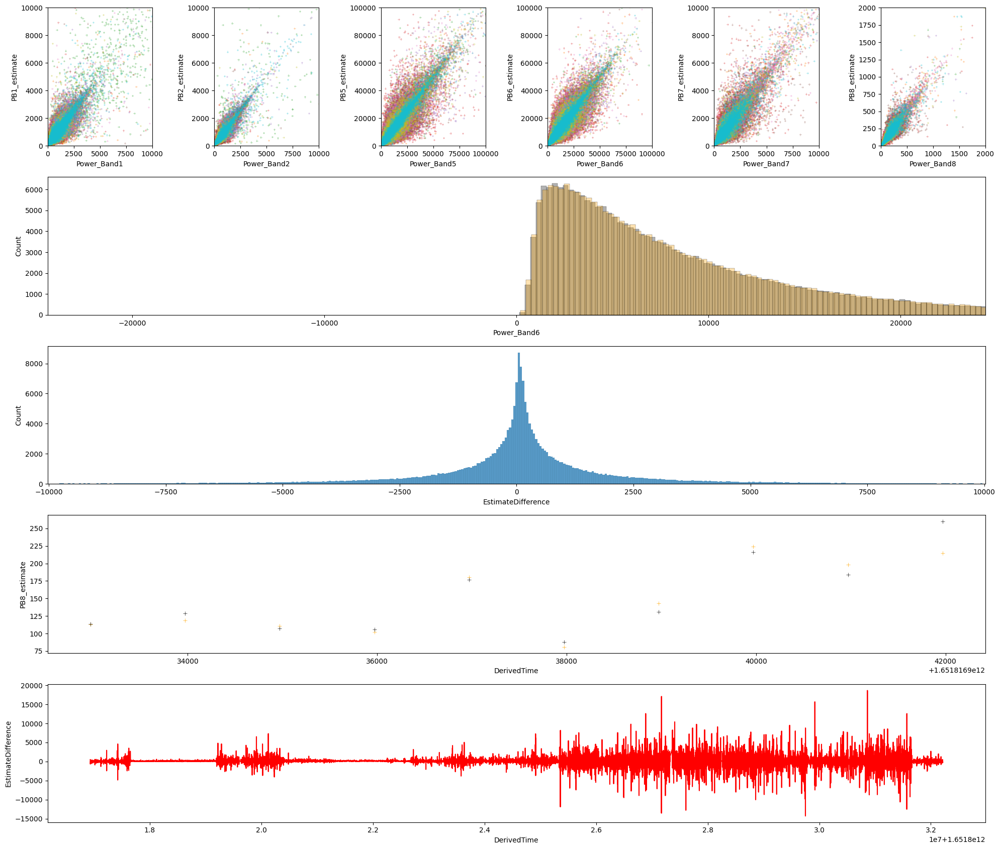

ON DEVICE: 02R
{'samplingRate': [500], 'gain_1': [232], 'gain_2': [232], 'gain_3': [230], 'gain_4': [232], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

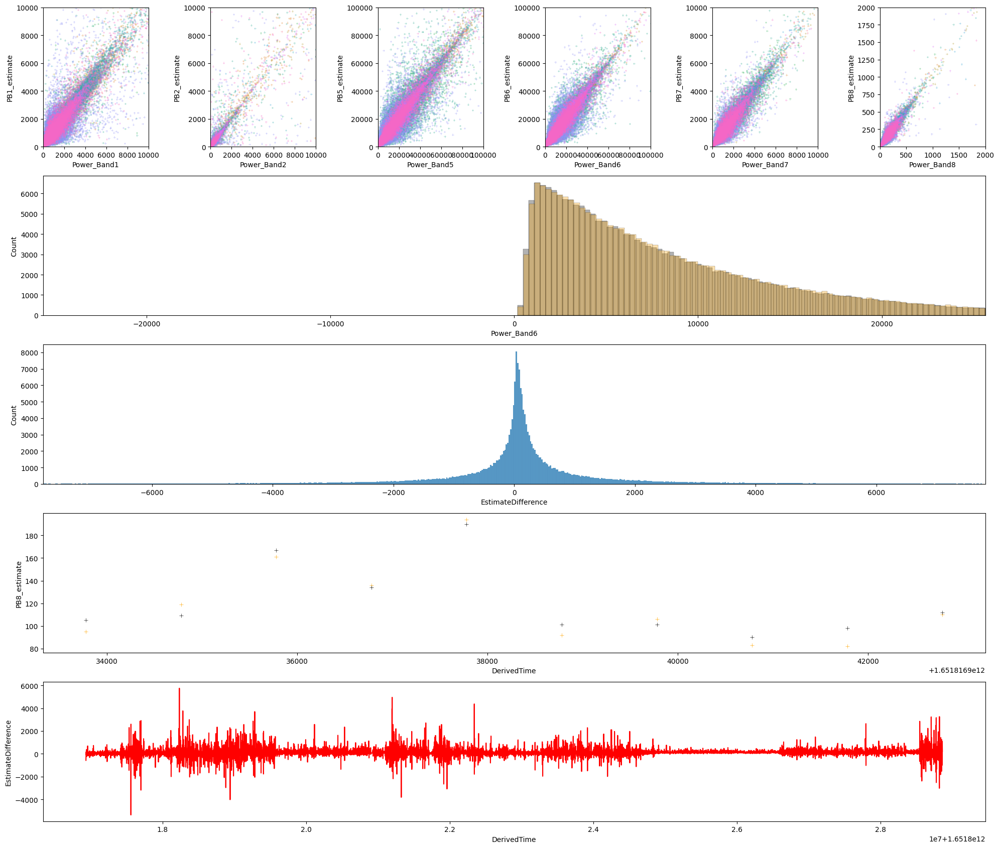

ON DEVICE: 03L
{'samplingRate': [500], 'gain_1': [231], 'gain_2': [231], 'gain_3': [227], 'gain_4': [231], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

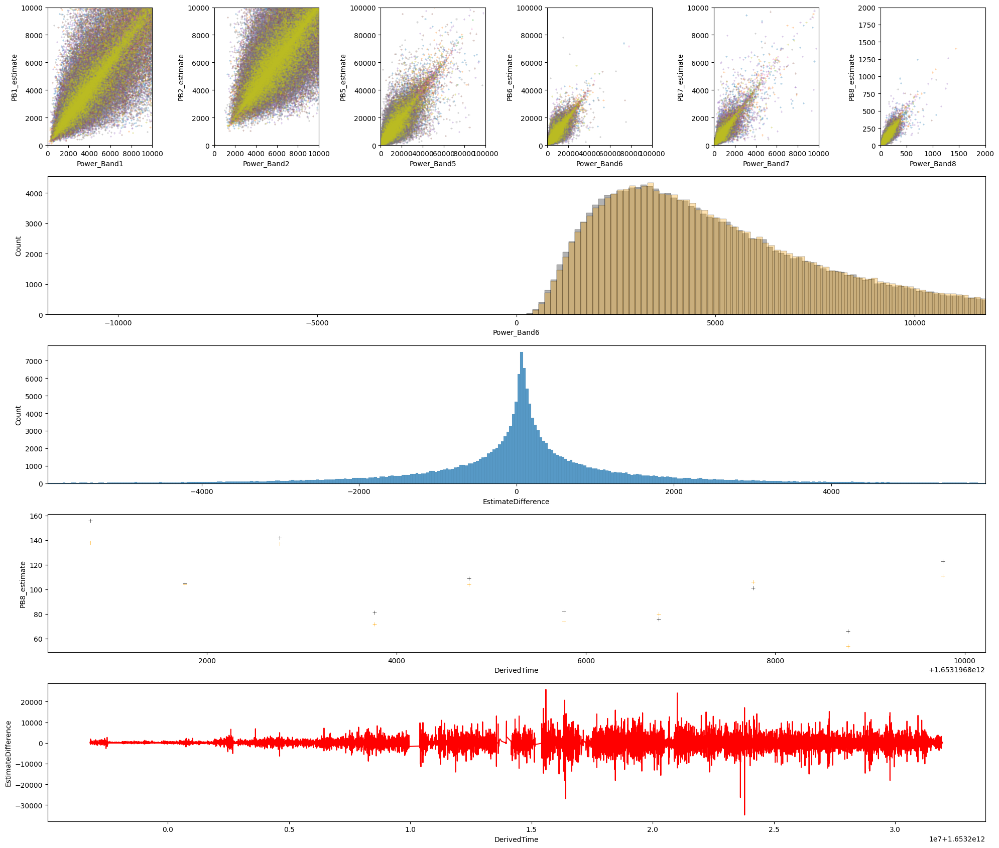

ON DEVICE: 03R
{'samplingRate': [500], 'gain_1': [232], 'gain_2': [231], 'gain_3': [231], 'gain_4': [234], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

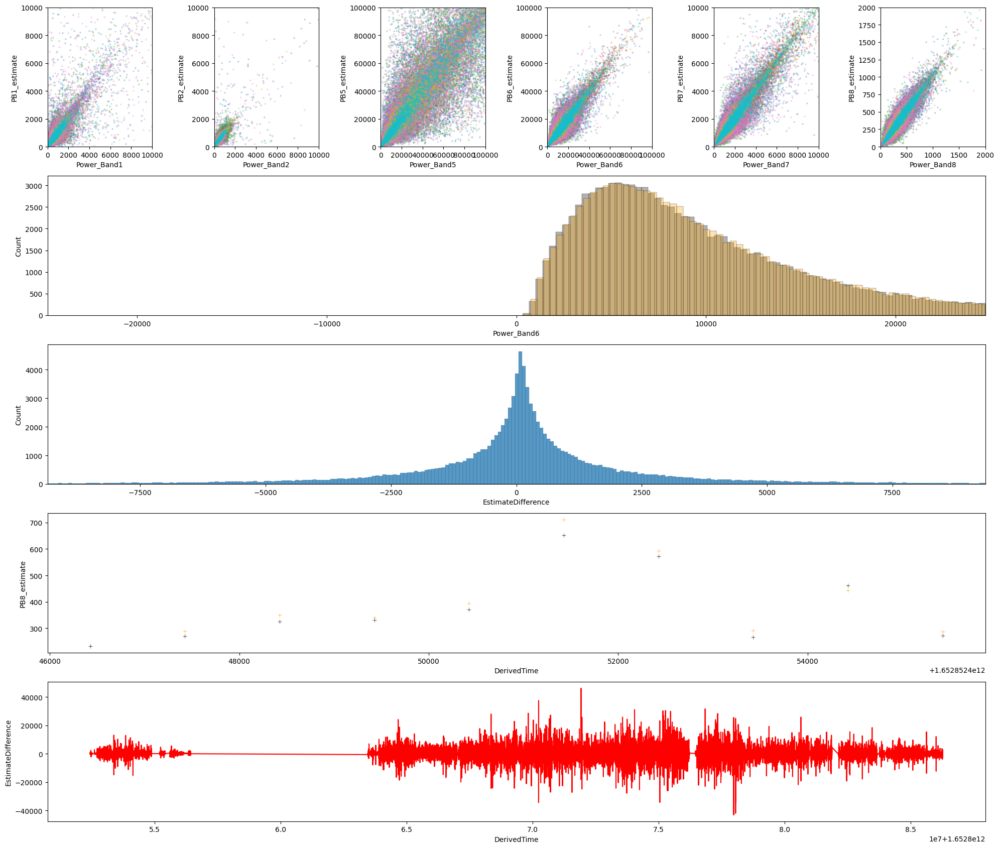

ON DEVICE: 07L
{'samplingRate': [500], 'gain_1': [233], 'gain_2': [232], 'gain_3': [233], 'gain_4': [231], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

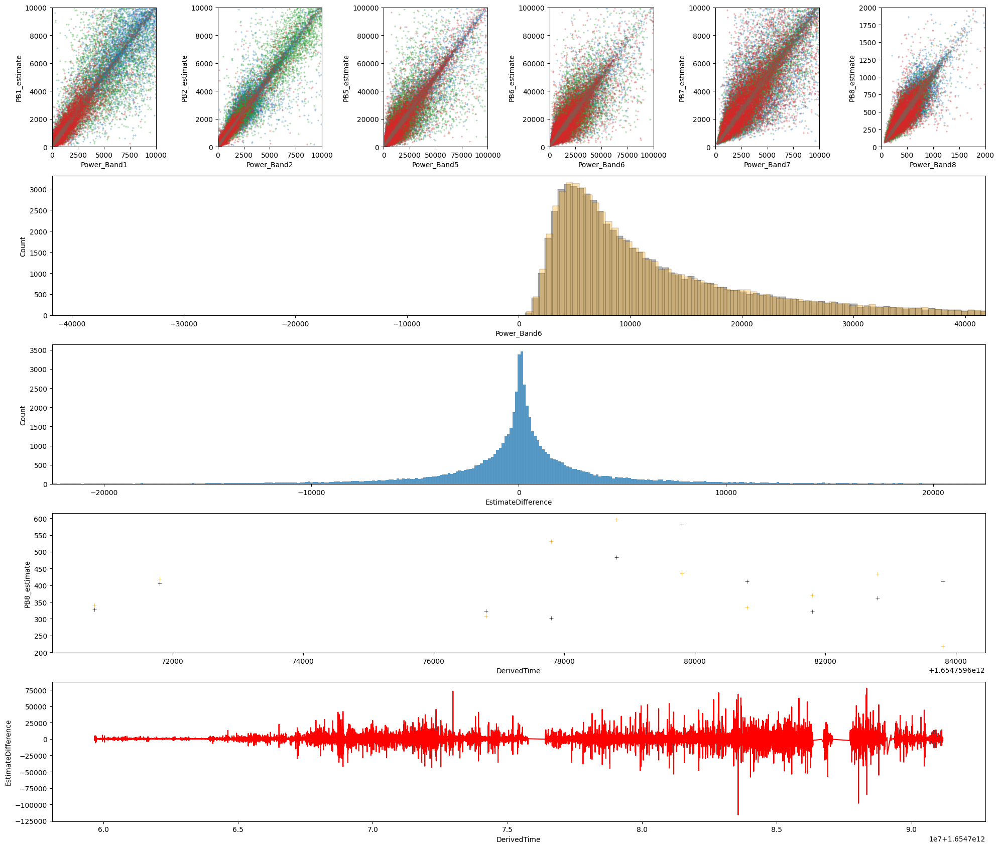

ON DEVICE: 07R
{'samplingRate': [500], 'gain_1': [234], 'gain_2': [233], 'gain_3': [233], 'gain_4': [233], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

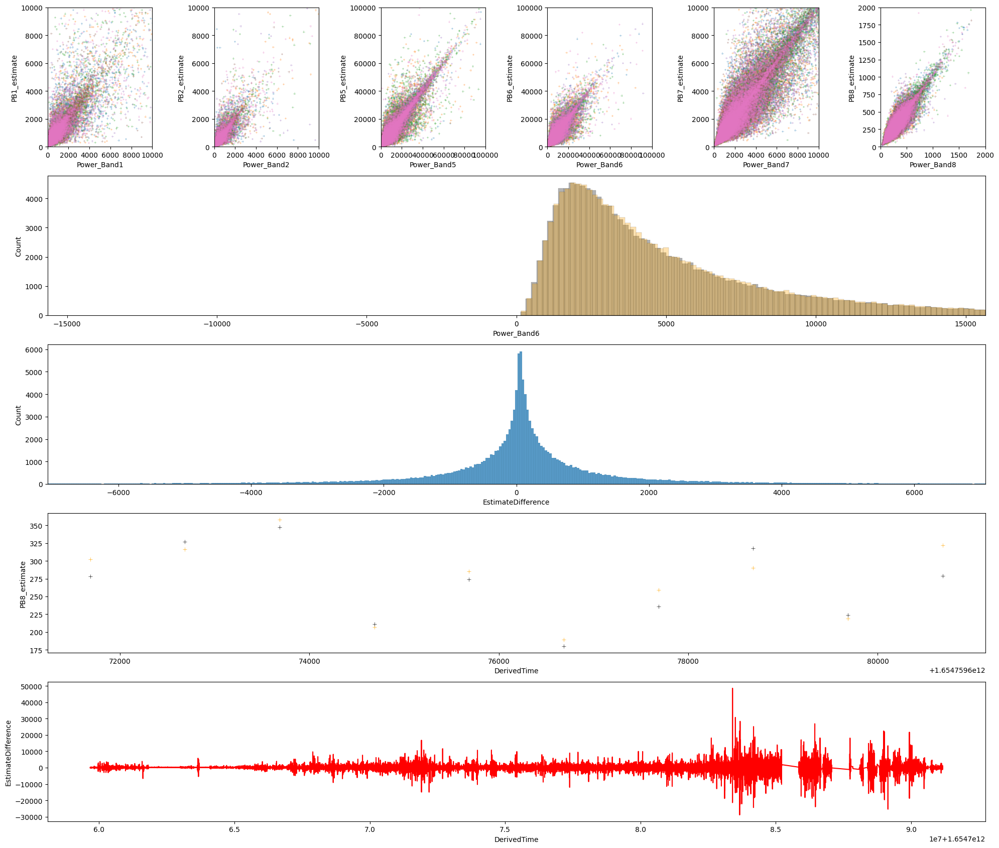

ON DEVICE: 09L
{'samplingRate': [500], 'gain_1': [233], 'gain_2': [234], 'gain_3': [235], 'gain_4': [233], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

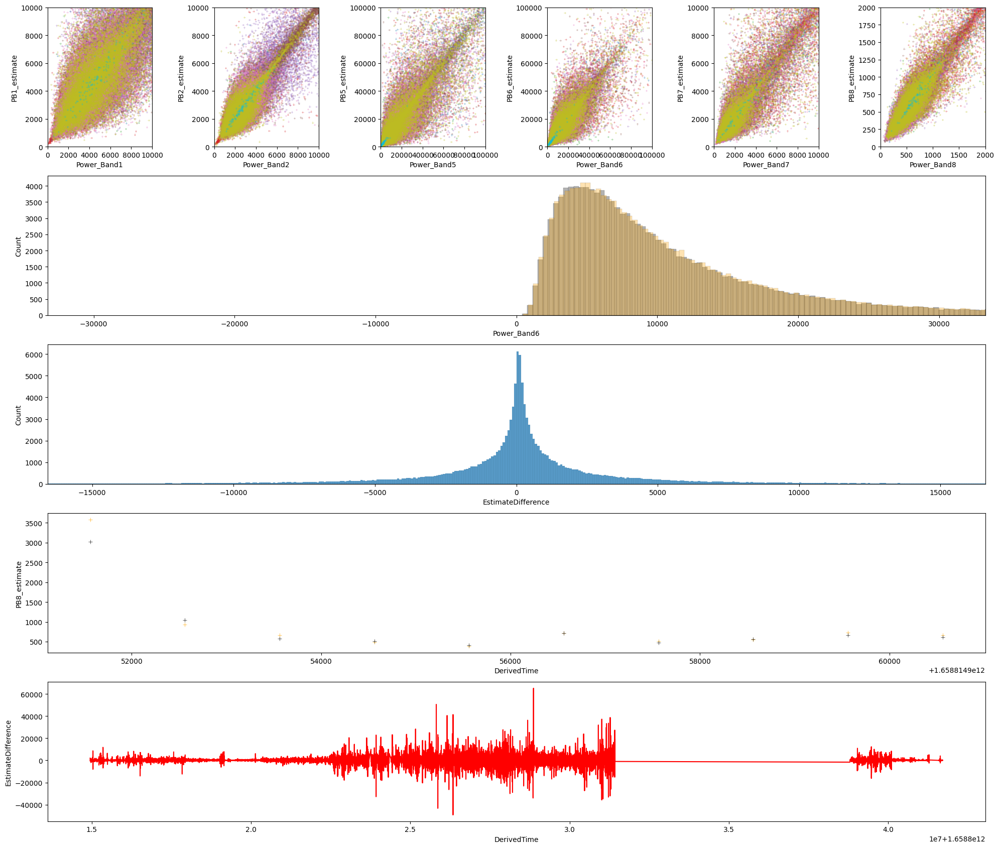

ON DEVICE: 09R
{'samplingRate': [500], 'gain_1': [231], 'gain_2': [231], 'gain_3': [231], 'gain_4': [232], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

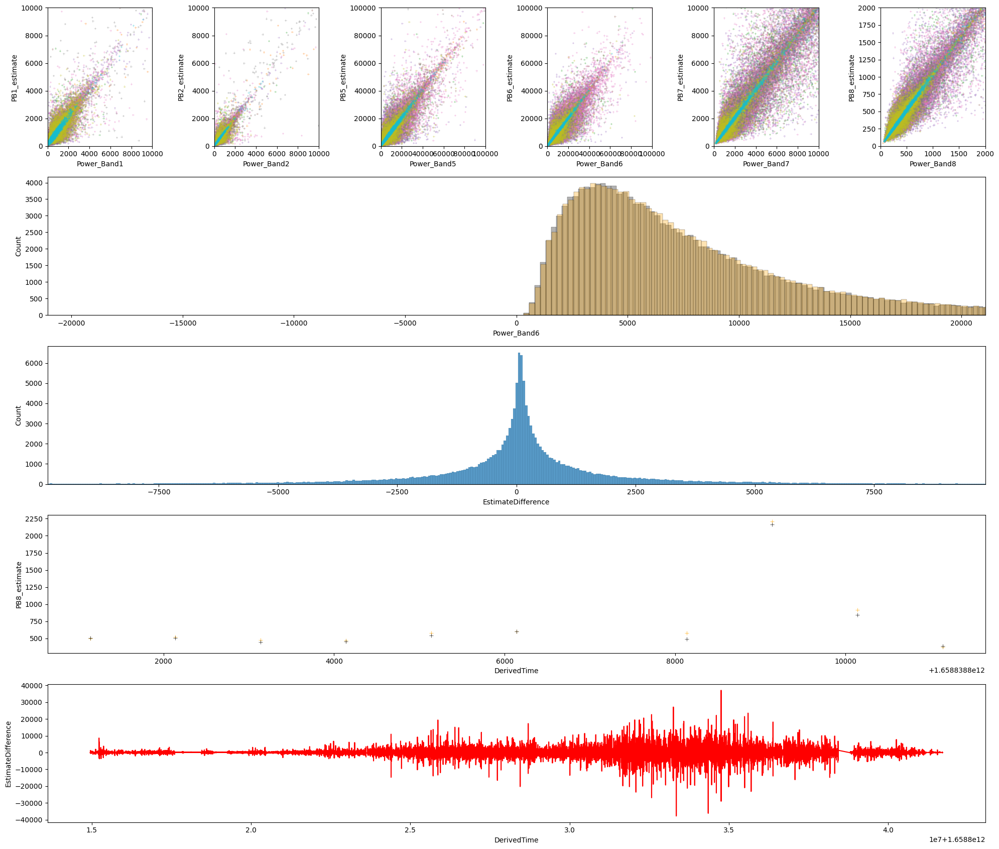

ON DEVICE: 16L
{'samplingRate': [500], 'gain_1': [235], 'gain_2': [236], 'gain_3': [235], 'gain_4': [235], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

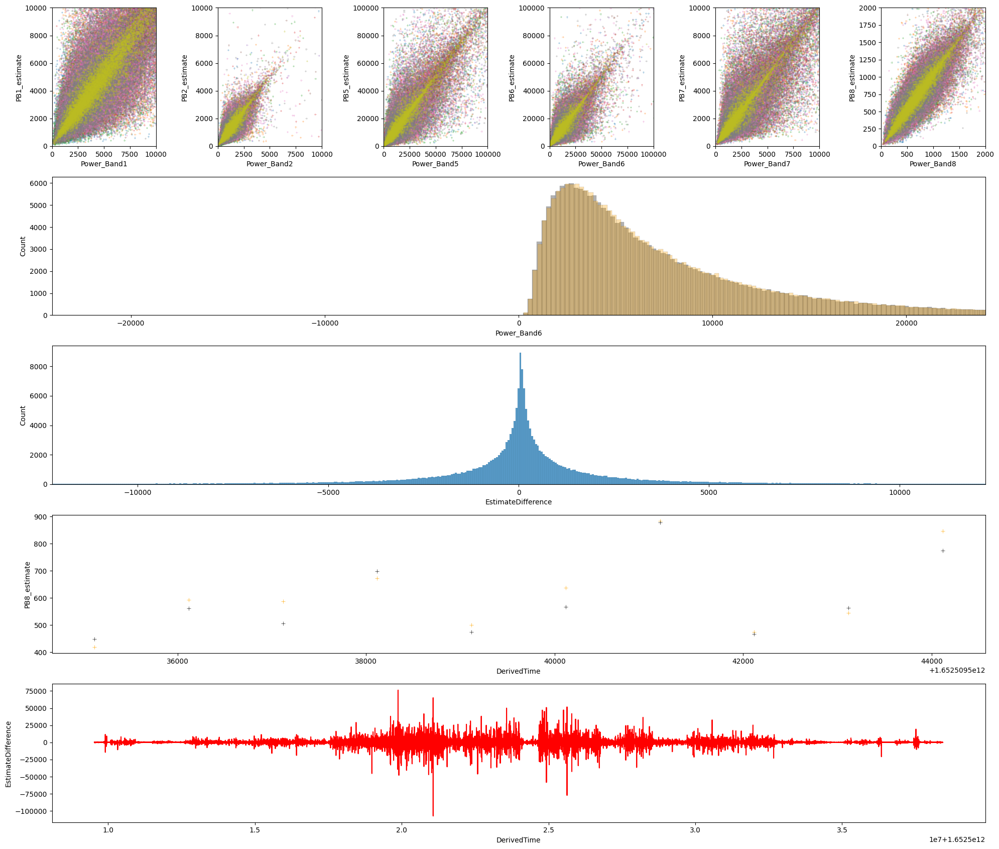

ON DEVICE: 16R
{'samplingRate': [500], 'gain_1': [234], 'gain_2': [233], 'gain_3': [232], 'gain_4': [231], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

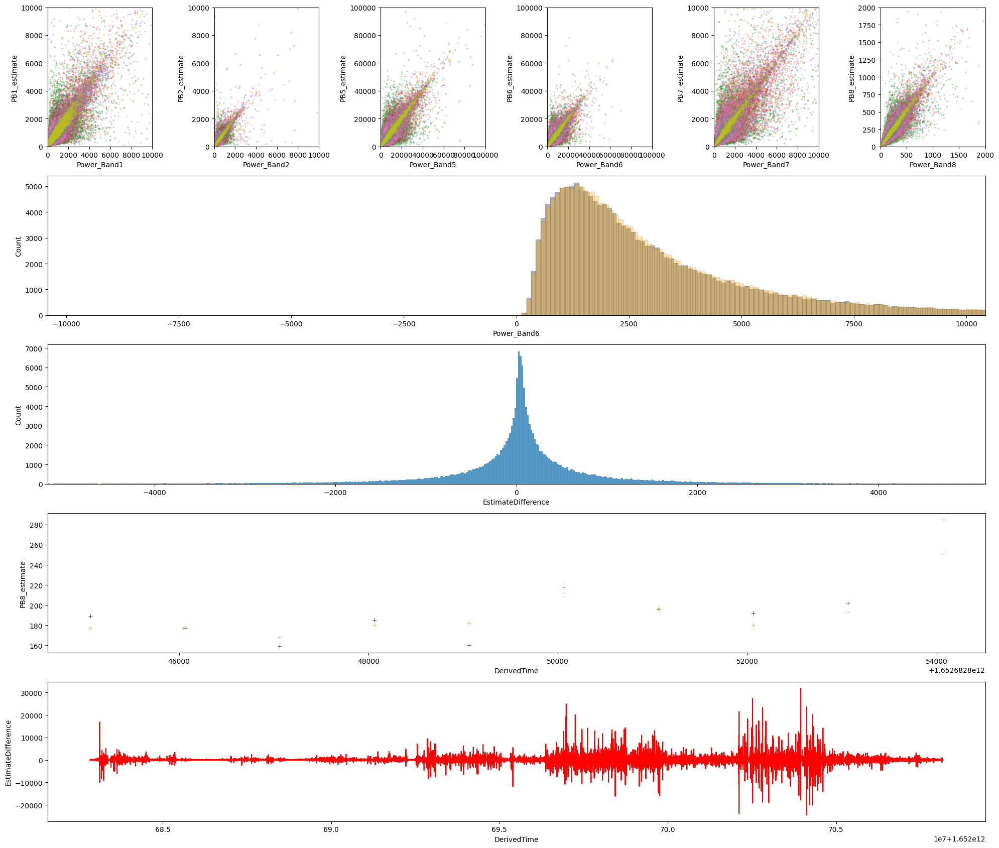

In [16]:
devices = ['02L', '02R', '03L', '03R', '07L', '07R', '09L', '09R', '16L', '16R']
#devices = ['02L']
for device in devices:
    df = pl.DataFrame(con.execute(f"Select DerivedTime, columns('^Session|TD_|Power_Band'), SleepStage from overnight.r{device}").arrow())
    if device == '07L':
        df = df.filter(~pl.col('SessionIdentity').is_in(['07L_07-22-22', '07L_07-26-22']))
    if device == '07R':
        df = df.filter(~pl.col('SessionIdentity').is_in(['07R_07-22-22', '07R_07-26-22']))
    df, bad_sessions = drop_unwanted_sessions_by_NaN_percent(df, 'TD_BG', .2, 'Session#')
    df = estimate_powerbands_by_PB_inds_remove_nans(df, 'Session#', device, con)

    fig = plt.figure(figsize=(20,17))
    gs0 = gridspec.GridSpec(5, 6, figure=fig)
    for i, j in enumerate([1,2,5,6,7,8]):
        axs = fig.add_subplot(gs0[0,i])
        sns.scatterplot(data=df.filter(
            (pl.col('Power_Band8').is_not_null()) & (pl.col('PB8_estimate').is_not_null())), x=f'Power_Band{j}', y=f'PB{j}_estimate', hue='Session#', marker='+',
                        s=10, ax=axs)
        axs.get_legend().remove()
        if j in [1,2,7]:
            axs.set_xlim([0, 10000])
            axs.set_ylim([0, 10000])
        elif j == 8:
            axs.set_xlim([0, 2000])
            axs.set_ylim([0, 2000])
        else:
            axs.set_xlim([0, 20000*5])
            axs.set_ylim([0, 20000*5])
    axs2 = fig.add_subplot(gs0[1,:])

    # sns.scatterplot(data=df.filter(pl.col('SessionIdentity') == '02L_05-06-22').filter(
    #     (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null()))[:10], x='DerivedTime', y='PB8_estimate', color='orange', marker='+',
    #     s=30, ax=axs2)
    # sns.scatterplot(data=df.filter(pl.col('SessionIdentity') == '02L_05-06-22').filter(
    #     (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null()))[:10], x='DerivedTime', y='Power_Band8', color='black', marker='+',
    #     s=30, ax=axs2)

    dists = df.filter(
        (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null())
    ).select([
        'Power_Band6', 'PB6_estimate'
    ])
    sns.histplot(data=dists, x='Power_Band6',  color='k', alpha=0.3, ax=axs2)
    sns.histplot(data=dists, x='PB6_estimate',  color='orange', alpha=0.3, ax=axs2)
    var = dists.std()[0,0]
    axs2.set_xlim([-var*3, var*3])

    # axs3 = fig.add_subplot(gs0[2,:])
    # noise = (
    #             df.filter(
    #             (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null())
    #         ).select([
    #             (pl.col('PB6_estimate') - pl.col('Power_Band6')).alias('EstimateDifference')
    #         ])
    # )
    # var = noise.std()[0,0]
    # sns.histplot(data=noise, x='EstimateDifference', ax=axs3)
    # axs3.set_xlim([-var*3, var*3])

    axs3 = fig.add_subplot(gs0[2,:])
    noise = (
        df.filter(
            (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null())
        ).select([
            pl.col('DerivedTime'),
            pl.col('SessionIdentity'),
            (pl.col('PB6_estimate') - pl.col('Power_Band6')).alias('EstimateDifference')
        ])
    )
    var = noise.select('EstimateDifference').std()[0,0]
    sns.histplot(data=noise, x='EstimateDifference', ax=axs3)
    axs3.set_xlim([-var*3, var*3])

    axs4 = fig.add_subplot(gs0[3,:])
    sns.scatterplot(data=df.filter(
        (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null()))[:10], x='DerivedTime', y='PB8_estimate', color='orange', marker='+',
        s=30, ax=axs4)
    sns.scatterplot(data=df.filter(
        (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null()))[:10], x='DerivedTime', y='Power_Band8', color='k', marker='+',
        s=30, ax=axs4)

    axs5 = fig.add_subplot(gs0[4,:])
    get_session = noise.select(pl.col('SessionIdentity')).unique()[0,0]
    sns.lineplot(data=noise.filter(pl.col('SessionIdentity') == get_session), x='DerivedTime', y='EstimateDifference', color='red', ax=axs5)


    plt.tight_layout()
    plt.show()


In [36]:
con.close()

ON DEVICE: 02L
{'samplingRate': [500], 'gain_1': [232], 'gain_2': [231], 'gain_3': [233], 'gain_4': [231], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

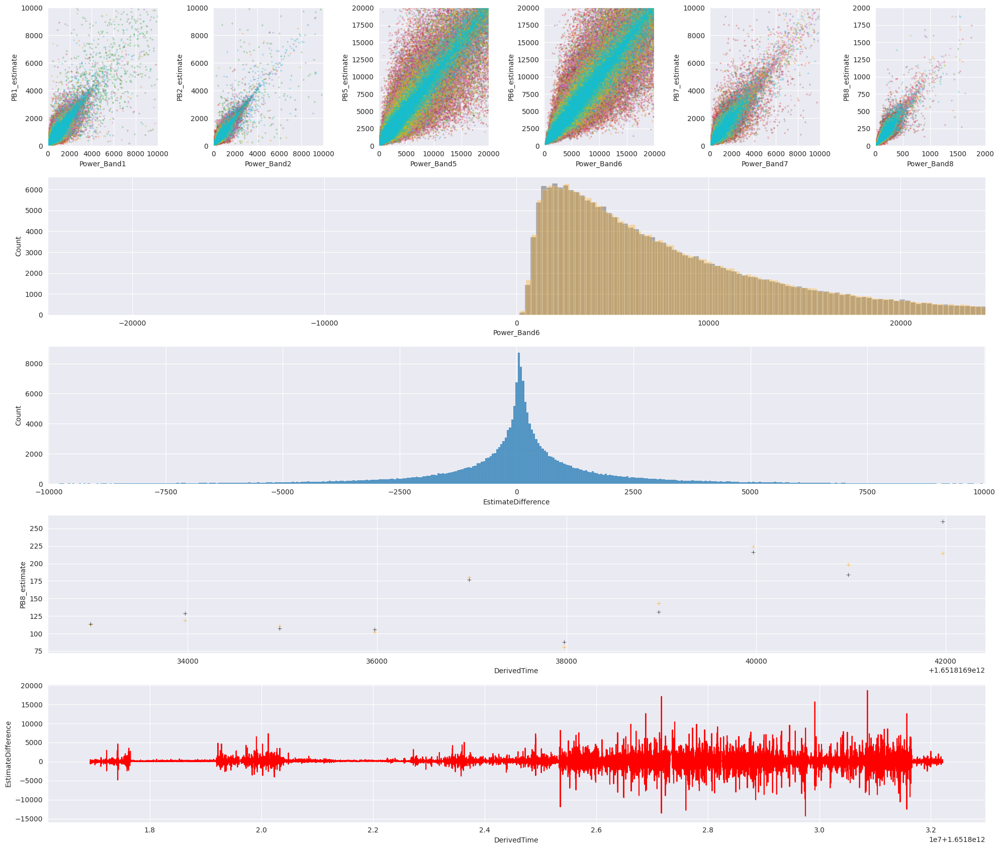

ON DEVICE: 02R
{'samplingRate': [500], 'gain_1': [232], 'gain_2': [232], 'gain_3': [230], 'gain_4': [232], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

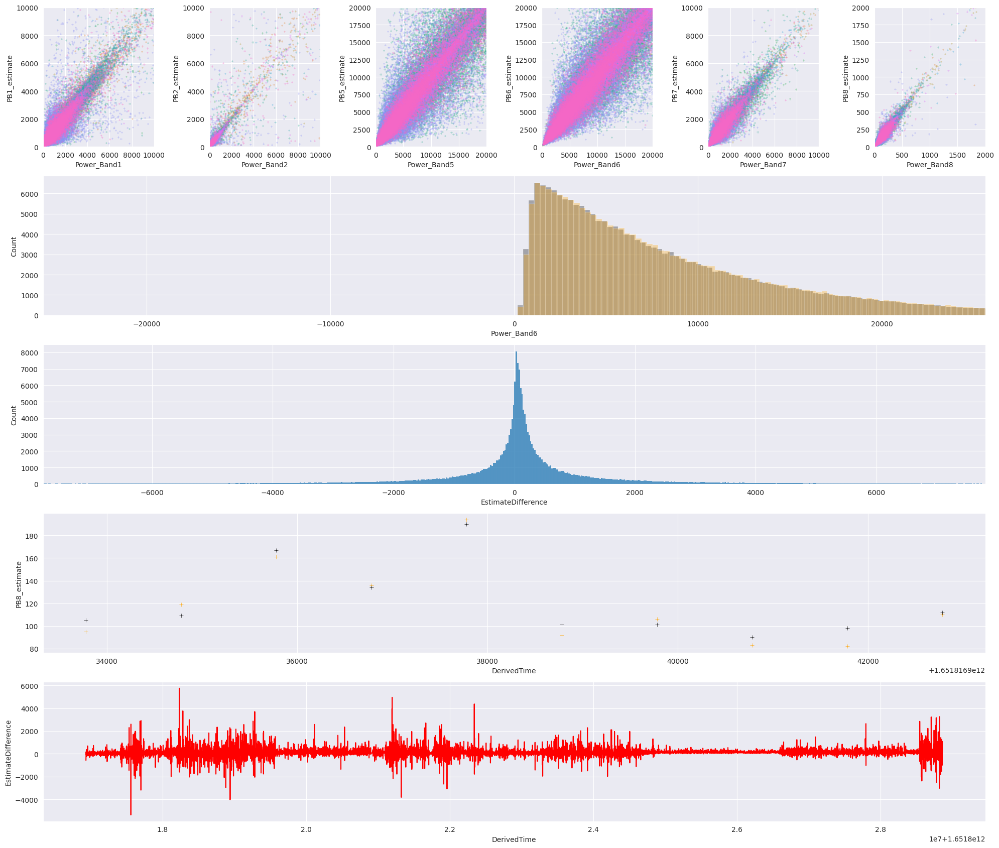

ON DEVICE: 03L
{'samplingRate': [500], 'gain_1': [231], 'gain_2': [231], 'gain_3': [227], 'gain_4': [231], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

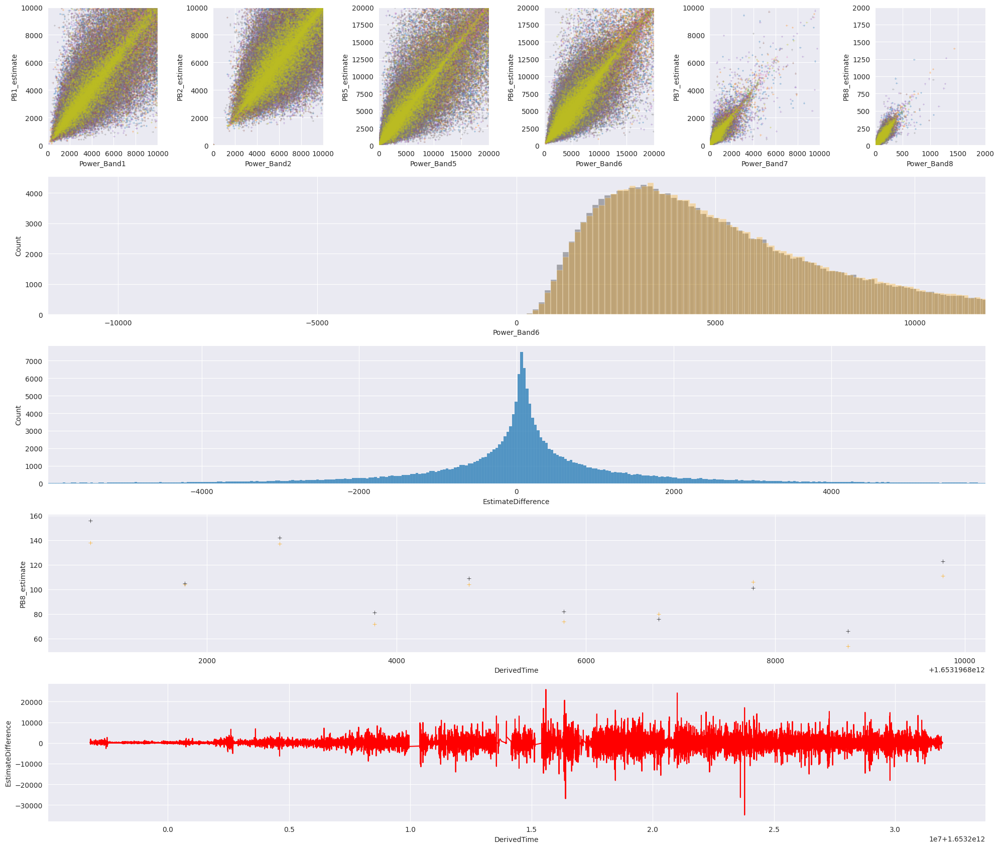

ON DEVICE: 03R
{'samplingRate': [500], 'gain_1': [232], 'gain_2': [231], 'gain_3': [231], 'gain_4': [234], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

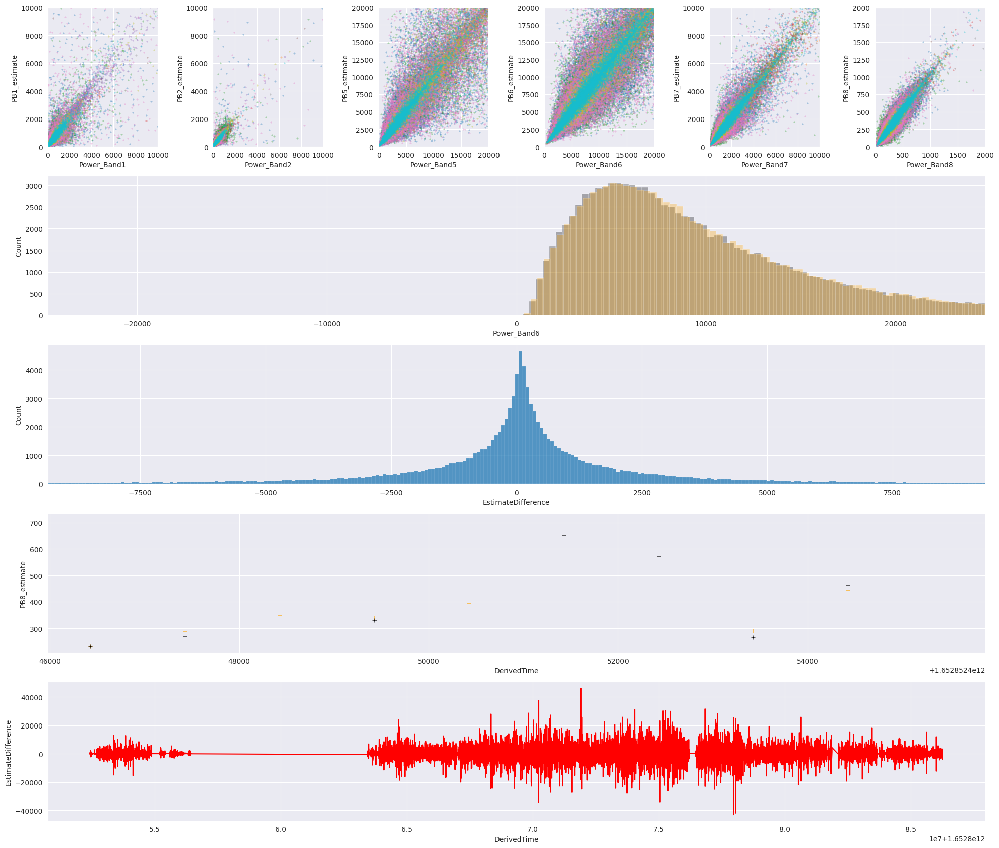

ON DEVICE: 07L
{'samplingRate': [500], 'gain_1': [233], 'gain_2': [232], 'gain_3': [233], 'gain_4': [231], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

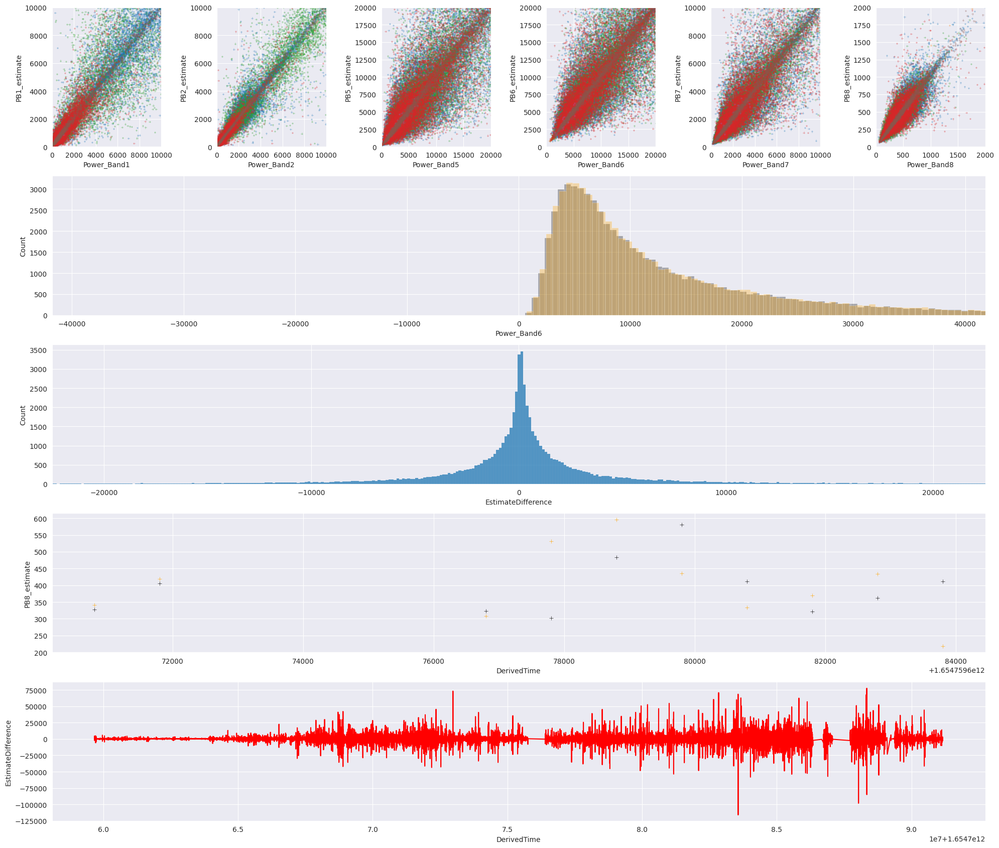

ON DEVICE: 07R
{'samplingRate': [500], 'gain_1': [234], 'gain_2': [233], 'gain_3': [233], 'gain_4': [233], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

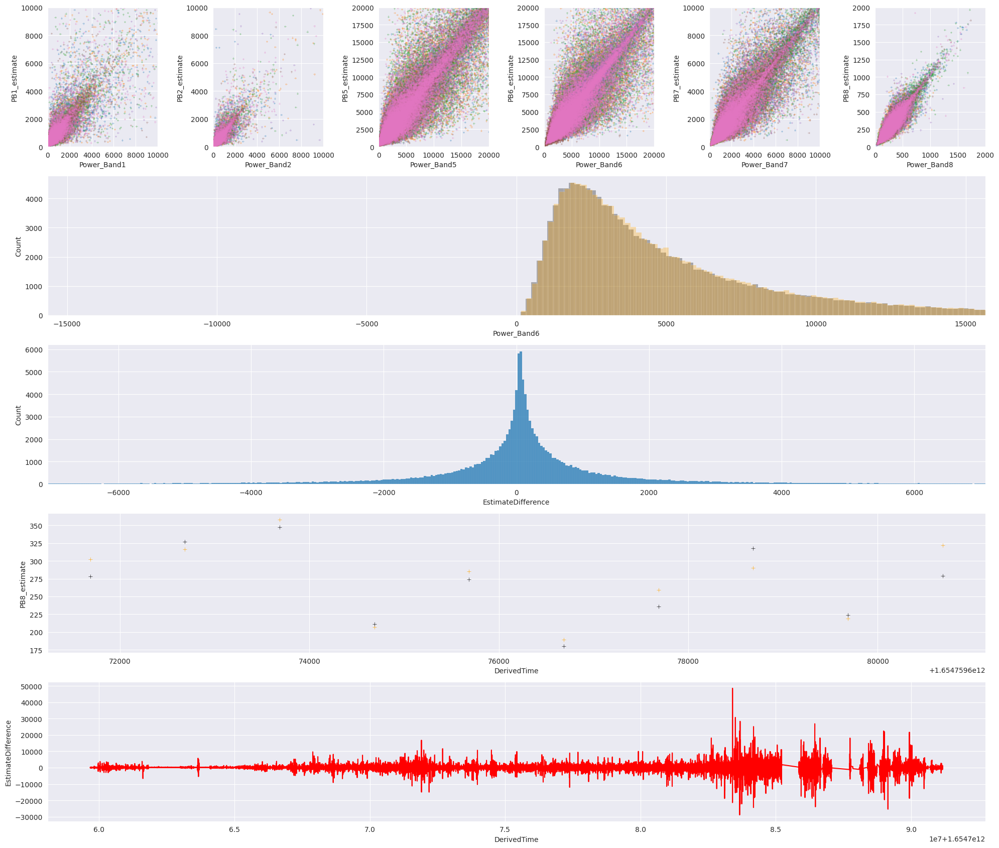

ON DEVICE: 09L
{'samplingRate': [500], 'gain_1': [233], 'gain_2': [234], 'gain_3': [235], 'gain_4': [233], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

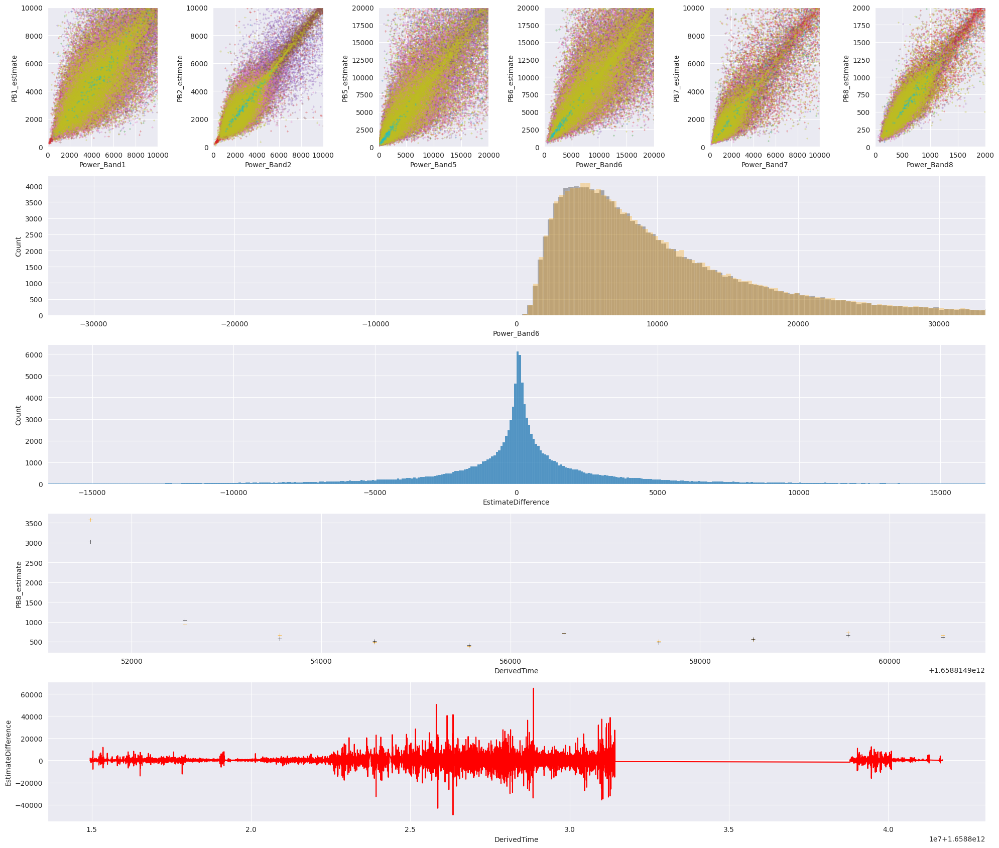

ON DEVICE: 09R
{'samplingRate': [500], 'gain_1': [231], 'gain_2': [231], 'gain_3': [231], 'gain_4': [232], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

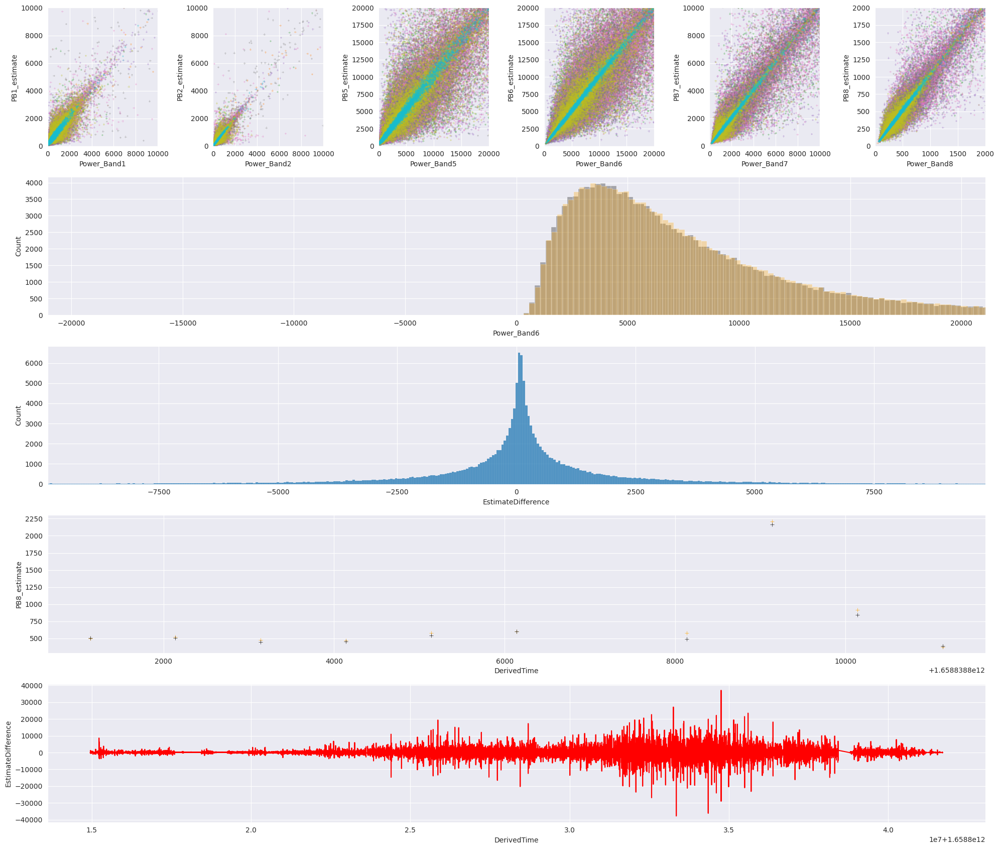

ON DEVICE: 16L
{'samplingRate': [500], 'gain_1': [235], 'gain_2': [236], 'gain_3': [235], 'gain_4': [235], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.15-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['10  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.39-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

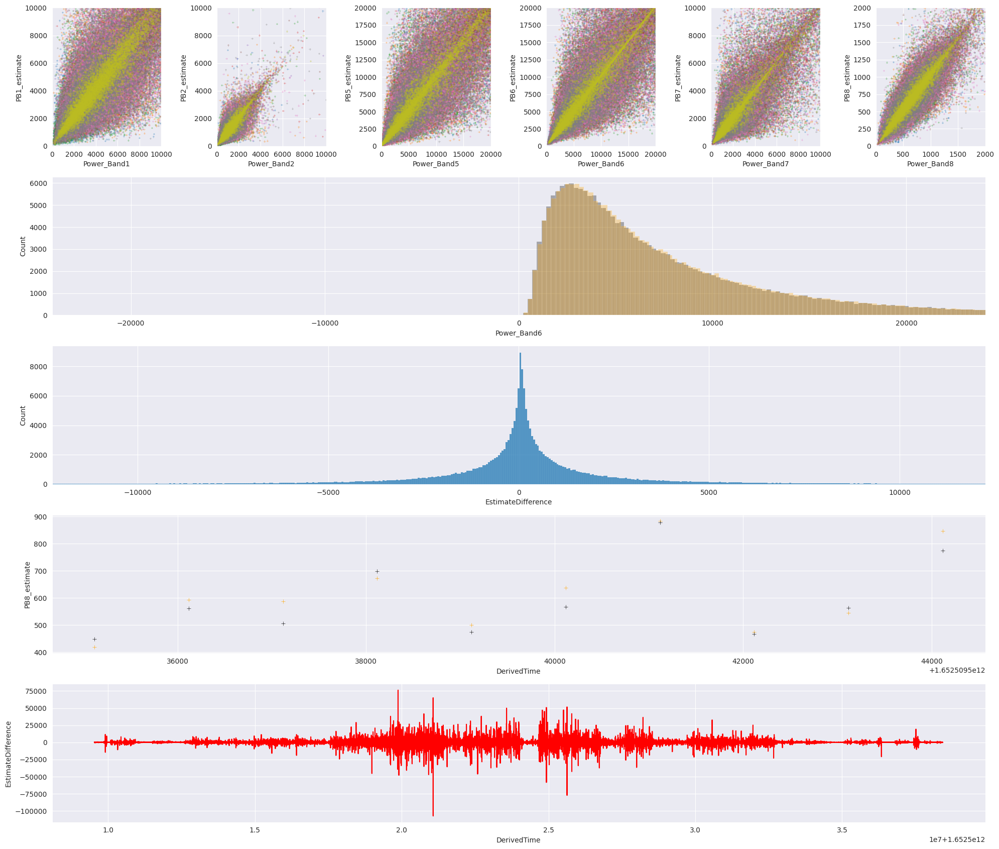

ON DEVICE: 16R
{'samplingRate': [500], 'gain_1': [234], 'gain_2': [233], 'gain_3': [232], 'gain_4': [231], 'fft_bandFormationConfig': [3], 'fft_interval': [1000], 'fft_size': [1024], 'fft_windowLoad': ['100% Hann'], 'Power_Band1': ['0.73-4.15'], 'Power_Band2': ['4.64-12.45'], 'Power_Band3': ['132.08-134.03'], 'Power_Band4': ['128.17-129.64'], 'Power_Band5': ['0.73-4.15'], 'Power_Band6': ['4.64-12.45'], 'Power_Band7': ['17.82-30.03'], 'Power_Band8': ['39.79-63.23'], 'Power_Band1_indices': ['3  9'], 'Power_Band2_indices': ['11  26'], 'Power_Band3_indices': ['272  275'], 'Power_Band4_indices': ['264  266'], 'Power_Band5_indices': ['3  9'], 'Power_Band6_indices': ['11  26'], 'Power_Band7_indices': ['38  62'], 'Power_Band8_indices': ['83  130'], 'Power_Band1_bins': ['0.98-3.91'], 'Power_Band2_bins': ['4.88-12.21'], 'Power_Band3_bins': ['132.32-133.79'], 'Power_Band4_bins': ['128.42-129.39'], 'Power_Band5_bins': ['0.98-3.91'], 'Power_Band6_bins': ['4.88-12.21'], 'Power_Band7_bins': ['18.07-2

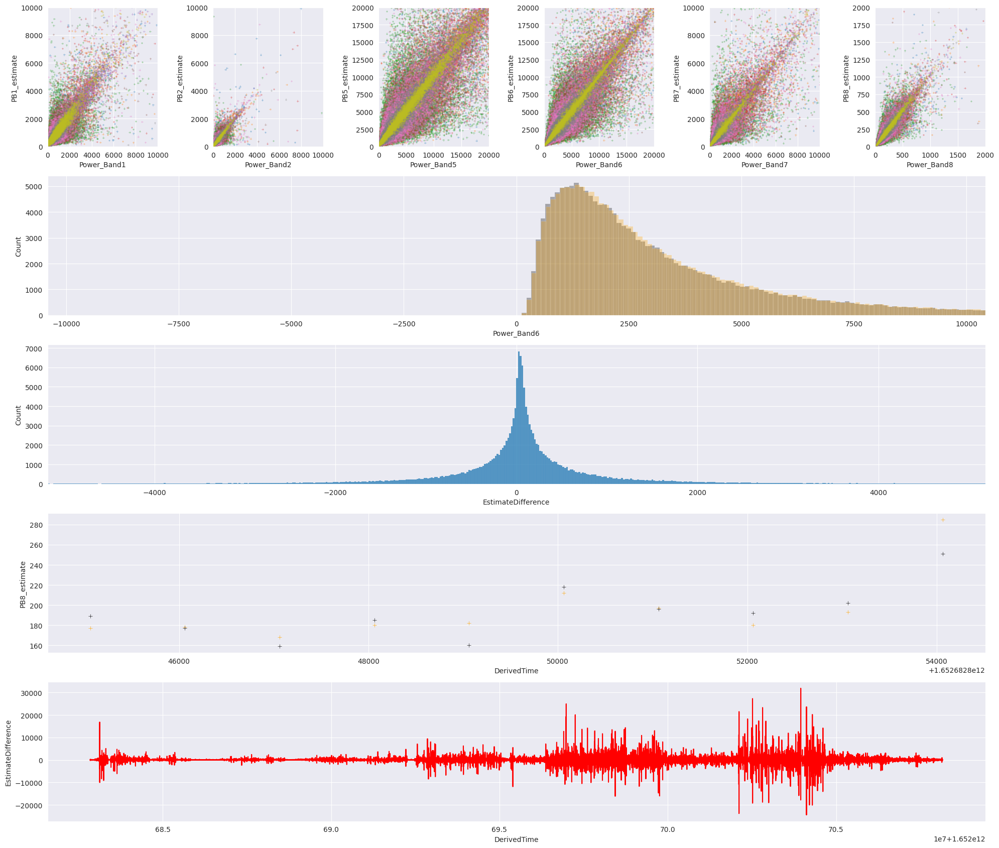

In [38]:
devices = ['02L', '02R', '03L', '03R', '07L', '07R', '09L', '09R', '16L', '16R']
#devices = ['02L']
for device in devices:
    df = pl.DataFrame(con.execute(
        f"Select DerivedTime, columns('^Session|TD_|Power_Band'), SleepStage from overnight.r{device}").arrow())
    if device == '07L':
        df = df.filter(~pl.col('SessionIdentity').is_in(['07L_07-22-22', '07L_07-26-22']))
    if device == '07R':
        df = df.filter(~pl.col('SessionIdentity').is_in(['07R_07-22-22', '07R_07-26-22']))
    df, bad_sessions = drop_unwanted_sessions_by_NaN_percent(df, 'TD_BG', .2, 'Session#')
    df = estimate_powerbands_by_PB_inds_remove_nans(df, 'Session#', device, con)

    fig = plt.figure(figsize=(20, 17))
    gs0 = gridspec.GridSpec(5, 6, figure=fig)
    for i, j in enumerate([1, 2, 5, 6, 7, 8]):
        axs = fig.add_subplot(gs0[0, i])
        sns.scatterplot(data=df.filter(
            (pl.col('Power_Band8').is_not_null()) & (pl.col('PB8_estimate').is_not_null())), x=f'Power_Band{j}',
            y=f'PB{j}_estimate', hue='Session#', marker='+',
            s=10, ax=axs)
        axs.get_legend().remove()
        if j in [1, 2, 7]:
            axs.set_xlim([0, 10000])
            axs.set_ylim([0, 10000])
        elif j == 8:
            axs.set_xlim([0, 2000])
            axs.set_ylim([0, 2000])
        else:
            axs.set_xlim([0, 20000])
            axs.set_ylim([0, 20000])
    axs2 = fig.add_subplot(gs0[1, :])

    # sns.scatterplot(data=df.filter(pl.col('SessionIdentity') == '02L_05-06-22').filter(
    #     (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null()))[:10], x='DerivedTime', y='PB8_estimate', color='orange', marker='+',
    #     s=30, ax=axs2)
    # sns.scatterplot(data=df.filter(pl.col('SessionIdentity') == '02L_05-06-22').filter(
    #     (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null()))[:10], x='DerivedTime', y='Power_Band8', color='black', marker='+',
    #     s=30, ax=axs2)

    dists = df.filter(
        (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null())
    ).select([
        'Power_Band6', 'PB6_estimate'
    ])
    sns.histplot(data=dists, x='Power_Band6', color='k', alpha=0.3, ax=axs2)
    sns.histplot(data=dists, x='PB6_estimate', color='orange', alpha=0.3, ax=axs2)
    var = dists.std()[0, 0]
    axs2.set_xlim([-var * 3, var * 3])

    # axs3 = fig.add_subplot(gs0[2,:])
    # noise = (
    #             df.filter(
    #             (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null())
    #         ).select([
    #             (pl.col('PB6_estimate') - pl.col('Power_Band6')).alias('EstimateDifference')
    #         ])
    # )
    # var = noise.std()[0,0]
    # sns.histplot(data=noise, x='EstimateDifference', ax=axs3)
    # axs3.set_xlim([-var*3, var*3])

    axs3 = fig.add_subplot(gs0[2, :])
    noise = (
        df.filter(
            (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null())
        ).select([
            pl.col('DerivedTime'),
            pl.col('SessionIdentity'),
            (pl.col('PB6_estimate') - pl.col('Power_Band6')).alias('EstimateDifference')
        ])
    )
    var = noise.select('EstimateDifference').std()[0, 0]
    sns.histplot(data=noise, x='EstimateDifference', ax=axs3)
    axs3.set_xlim([-var * 3, var * 3])

    axs4 = fig.add_subplot(gs0[3, :])
    sns.scatterplot(data=df.filter(
        (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null()))[:10], x='DerivedTime',
                    y='PB8_estimate', color='orange', marker='+',
                    s=30, ax=axs4)
    sns.scatterplot(data=df.filter(
        (pl.col('Power_Band5').is_not_null()) & (pl.col('PB5_estimate').is_not_null()))[:10], x='DerivedTime',
                    y='Power_Band8', color='k', marker='+',
                    s=30, ax=axs4)

    axs5 = fig.add_subplot(gs0[4, :])
    get_session = noise.select(pl.col('SessionIdentity')).unique()[0, 0]
    sns.lineplot(data=noise.filter(pl.col('SessionIdentity') == get_session), x='DerivedTime', y='EstimateDifference',
                 color='red', ax=axs5)

    plt.tight_layout()
    plt.show()
